スニーカーやシャツなど、身に着けるものの写真を分類するニューラルネットワークのモデルを訓練します。

In [69]:
# TensorFlow と tf.keras のインポート
import tensorflow as tf
from tensorflow import keras

# ヘルパーライブラリのインポート
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.9.1


ファッションMNISTデータセットのロード

In [70]:
fashion_mnist = keras.datasets.fashion_mnist

(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

クラス名が含まれていないため、後ほど画像を出力するときのために、クラス名を保存しておく。

In [71]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

訓練用データセットには28×28ピクセルの画像が60,000枚含まれている

In [72]:
train_images.shape

(60000, 28, 28)

In [73]:
train_images = np.array([np.array(img).flatten() for img in train_images])
np.array(train_images).shape
test_images = np.array([np.array(img).flatten() for img in test_images])
np.array(test_images).shape

(10000, 784)

訓練用データセットには60,000個のラベルが含まれている

In [74]:
len(train_labels)

60000

ラベルはそれぞれ、0から9までの間の整数

In [75]:
train_labels

array([9, 0, 0, ..., 3, 0, 5], dtype=uint8)

テスト用データセットには、10,000枚の画像が含まれます。画像は28×28ピクセルで構成されている

In [76]:
test_images.shape

(10000, 784)

テスト用データセットには10,000個のラベルが含まれている

In [77]:
len(test_labels)

10000

データの前処理

最初の画像を調べてみればわかるように、ピクセルの値は0から255の間の数値である

In [78]:
# plt.figure()
# plt.imshow(train_images[0])
# plt.colorbar()
# plt.grid(False)
# plt.show()

正規化するため画素の値を255で割る

In [79]:
train_images = train_images / 255.0

test_images = test_images / 255.0

訓練用データセットの最初の25枚の画像を、クラス名付きで表示してみる

In [80]:
# plt.figure(figsize=(10,10))
# for i in range(25):
#     plt.subplot(5,5,i+1)
#     plt.xticks([])
#     plt.yticks([])
#     plt.grid(False)
#     plt.imshow(train_images[i], cmap=plt.cm.binary)
#     plt.xlabel(class_names[train_labels[i]])
# plt.show()

In [81]:
def _change_one_hot_label(X):
    T = np.zeros((X.size, 10))
    for idx, row in enumerate(T):
        row[X[idx]] = 1

    return T

train_labels = _change_one_hot_label(train_labels)
test_labels = _change_one_hot_label(test_labels)

認識精度

[[-0.00037121 -0.03350102  0.06300943 ... -0.07732516  0.06853984
   0.02191045]
 [ 0.09629685 -0.09155295 -0.1233781  ... -0.15934566 -0.0476159
   0.09737583]
 [ 0.19095919 -0.07908626 -0.10028631 ... -0.03258044 -0.20727243
   0.00067577]
 ...
 [-0.00111151 -0.04050356 -0.13860233 ...  0.09146631 -0.16966683
   0.10317089]
 [ 0.05527402 -0.08450151  0.01752693 ... -0.03074808  0.00047642
   0.02394969]
 [-0.0313276   0.05320554 -0.05087201 ...  0.02319574 -0.11694689
   0.06601341]]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
train acc, test acc | 0.1, 0.1
[[ 0.01341101 -0.01956704 -0.06474638 ...  0.01131518  0.0123143
   0.05733276]
 [-0.06068989 -0.09136364 -0.12724586 ...  0.09769724 -0.2380746
   0.20438243]
 [ 0.04920132 -0.0334869  -0.02631179 ... -0.04114574 -0.10788831
   0.01651571]
 ...
 [-0.09931574  0.04649409 -0.08325863 ...  0.00654237 -0.15887251
   0.1120570

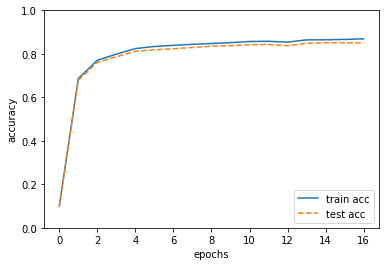

In [82]:
from two_layer_net import TwoLayerNet

network = TwoLayerNet(input_size=784, hidden_size=50, output_size=10)

iters_num = 10000  # 繰り返しの回数を適宜設定する
train_size = train_images.shape[0]
batch_size = 100
learning_rate = 0.1

train_loss_list = []
train_acc_list = []
test_acc_list = []
#1エポックあたりの繰り返し数
iter_per_epoch = max(train_size / batch_size, 1)

for i in range(iters_num):
    batch_mask = np.random.choice(train_size, batch_size)
    x_batch = train_images[batch_mask]
    t_batch = train_labels[batch_mask]
    
    # 勾配の計算
    #grad = network.numerical_gradient(x_batch, t_batch)
    grad = network.gradient(x_batch, t_batch) #高速版
    
    # パラメータの更新
    for key in ('W1', 'b1', 'W2', 'b2'):
        network.params[key] -= learning_rate * grad[key]
    
    loss = network.loss(x_batch, t_batch)
    train_loss_list.append(loss)
    
    #1エポックごとに認識精度を計算
    if i % iter_per_epoch == 0:
        train_acc = network.accuracy(train_images, train_labels)
        test_acc = network.accuracy(test_images, test_labels)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)
        print("train acc, test acc | " + str(train_acc) + ", " + str(test_acc))

# グラフの描画
markers = {'train': 'o', 'test': 's'}
x = np.arange(len(train_acc_list))
plt.plot(x, train_acc_list, label='train acc')
plt.plot(x, test_acc_list, label='test acc', linestyle='--')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()